In [ ]:
!pip install libauc==1.2.0
!pip install medmnist
!pip install torchio
import medmnist
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms
import os
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm
from sklearn.metrics import roc_auc_score
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset
from torchvision.models import resnet50
from medmnist import INFO, Evaluator
from libauc.models import resnet18
from libauc.sampler import DualSampler
from libauc.metrics import auc_prc_score
from PIL import Image, ImageFilter
from torchio import Image
from torchio.transforms import RandomAffine, RandomFlip, RandomNoise, RandomGamma

In [15]:
data_flag = 'pneumoniamnist'
download = True
BATCH_SIZE = 128 #42
info = medmnist.INFO[data_flag]
n_classes = len(info['label'])
DataClass = getattr(medmnist, info['python_class'])

In [16]:
class ImageDataset(Dataset):
    def __init__(self, images, targets, image_size=64, mode='train', kernel_size=3):
        self.images = images.astype(np.uint8)
        self.targets = targets
        self.mode = mode

        self.transform_train = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Grayscale(num_output_channels=3),
            transforms.Resize((image_size, image_size)),
            transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.9, 1.2), shear=0.2),
            transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            transforms.GaussianBlur(kernel_size=kernel_size),
            transforms.ToTensor(),
        ])

        self.transform_test = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Grayscale(num_output_channels=3),
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        target = self.targets[idx]

        if self.mode == 'train':
            image = self.transform_train(image)
        else:
            image = self.transform_test(image)

        return image, target.squeeze()


In [17]:
train_dataset = DataClass(split='train', download=download)
test_dataset = DataClass(split='test', download=download)

train_images = np.array([np.asarray(image) for (image, target) in train_dataset])
train_labels = np.array([target for (image, target) in train_dataset])

test_images = np.array([np.asarray(image) for (image, target) in test_dataset])
test_labels = [target for (image, target) in test_dataset]

train_set = ImageDataset(train_images, train_labels)
test_set = ImageDataset(test_images, test_labels)

train_loader = data.DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True)
test_loader = data.DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False)

model = resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, n_classes)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = ReduceLROnPlateau(optimizer, 'max', patience=3, verbose=True)

model.to(device)
num_epochs = 10
best_auc = 0.0

Using downloaded and verified file: /root/.medmnist/pneumoniamnist.npz
Using downloaded and verified file: /root/.medmnist/pneumoniamnist.npz


In [42]:
train_embeddings = []
test_embeddings = []
test_predicted_labels = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}'):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(train_loader.dataset)
    print(f'Training Loss: {epoch_loss:.4f}')


    model.eval()
    all_preds = []
    all_targets = []
    test_epoch_embeddings = []
    test_epoch_predicted_labels = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc=f'Validation {epoch+1}/{num_epochs}'):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(labels.cpu().numpy())
            test_epoch_embeddings.extend(outputs.cpu().numpy())
            test_epoch_predicted_labels.extend(preds.cpu().numpy())

    epoch_auc = roc_auc_score(all_targets, all_preds)
    print(f'Epoch {epoch+1}/{num_epochs}, Validation AUC: {epoch_auc:.4f}')
    if epoch_auc > best_auc:
        best_auc = epoch_auc
        torch.save(model.state_dict(), 'best_model_resnet50.pth')
        print('Best model saved!')
    scheduler.step(epoch_auc)
    test_embeddings.append(test_epoch_embeddings)
    test_predicted_labels.append(test_epoch_predicted_labels)
print('Training finished!')
test_embeddings = np.concatenate(test_embeddings, axis=0)
test_predicted_labels = np.concatenate(test_predicted_labels, axis=0)

np.save('train_embeddings.npy', train_embeddings)
np.save('test_embeddings.npy', test_embeddings)
np.save('test_predicted_labels.npy', test_predicted_labels)


Epoch 1/10: 100%|██████████| 37/37 [05:42<00:00,  9.27s/it]


Training Loss: 0.2703


Validation 1/10: 100%|██████████| 5/5 [00:14<00:00,  2.95s/it]


Epoch 1/10, Validation AUC: 0.7235
Best model saved!


Epoch 2/10: 100%|██████████| 37/37 [05:54<00:00,  9.57s/it]


Training Loss: 0.1575


Validation 2/10: 100%|██████████| 5/5 [00:13<00:00,  2.69s/it]


Epoch 2/10, Validation AUC: 0.6226


Epoch 3/10: 100%|██████████| 37/37 [05:49<00:00,  9.44s/it]


Training Loss: 0.1476


Validation 3/10: 100%|██████████| 5/5 [00:14<00:00,  2.83s/it]


Epoch 3/10, Validation AUC: 0.8889
Best model saved!


Epoch 4/10: 100%|██████████| 37/37 [05:51<00:00,  9.50s/it]


Training Loss: 0.1400


Validation 4/10: 100%|██████████| 5/5 [00:13<00:00,  2.77s/it]


Epoch 4/10, Validation AUC: 0.8132


Epoch 5/10: 100%|██████████| 37/37 [06:04<00:00,  9.84s/it]


Training Loss: 0.1164


Validation 5/10: 100%|██████████| 5/5 [00:13<00:00,  2.74s/it]


Epoch 5/10, Validation AUC: 0.8855


Epoch 6/10: 100%|██████████| 37/37 [07:09<00:00, 11.60s/it]


Training Loss: 0.1187


Validation 6/10: 100%|██████████| 5/5 [00:17<00:00,  3.51s/it]


Epoch 6/10, Validation AUC: 0.8098


Epoch 7/10: 100%|██████████| 37/37 [05:52<00:00,  9.53s/it]


Training Loss: 0.1156


Validation 7/10: 100%|██████████| 5/5 [00:13<00:00,  2.70s/it]


Epoch 7/10, Validation AUC: 0.8808


Epoch 8/10: 100%|██████████| 37/37 [05:48<00:00,  9.42s/it]


Training Loss: 0.1036


Validation 8/10: 100%|██████████| 5/5 [00:13<00:00,  2.71s/it]


Epoch 8/10, Validation AUC: 0.7880


Epoch 9/10: 100%|██████████| 37/37 [05:59<00:00,  9.71s/it]


Training Loss: 0.0865


Validation 9/10: 100%|██████████| 5/5 [00:14<00:00,  2.91s/it]


Epoch 9/10, Validation AUC: 0.8265


Epoch 10/10: 100%|██████████| 37/37 [05:55<00:00,  9.62s/it]


Training Loss: 0.0852


Validation 10/10: 100%|██████████| 5/5 [00:14<00:00,  2.88s/it]

Epoch 10/10, Validation AUC: 0.7735
Training finished!


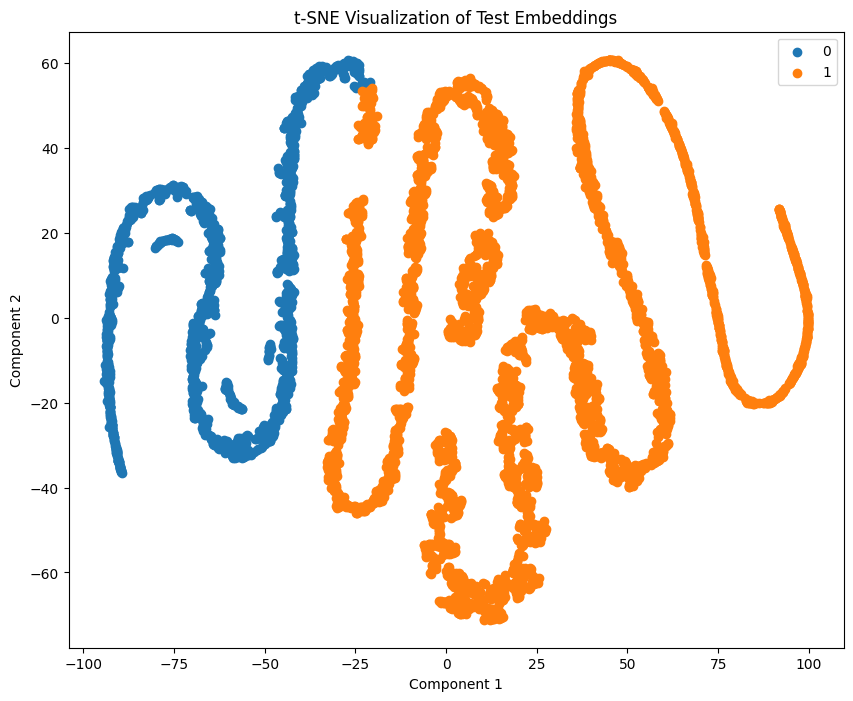

In [63]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

test_embeddings = np.load('test_embeddings.npy')
test_predicted_labels = np.load('test_predicted_labels.npy')

tsne = TSNE(n_components=2, random_state=42)
test_embeddings_2d = tsne.fit_transform(test_embeddings)

plt.figure(figsize=(10, 8))

for label in np.unique(test_predicted_labels):
    indices = np.where(test_predicted_labels == label)
    plt.scatter(test_embeddings_2d[indices, 0], test_embeddings_2d[indices, 1], label=label)

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('t-SNE Visualization of Test Embeddings')
plt.legend()

plt.show()


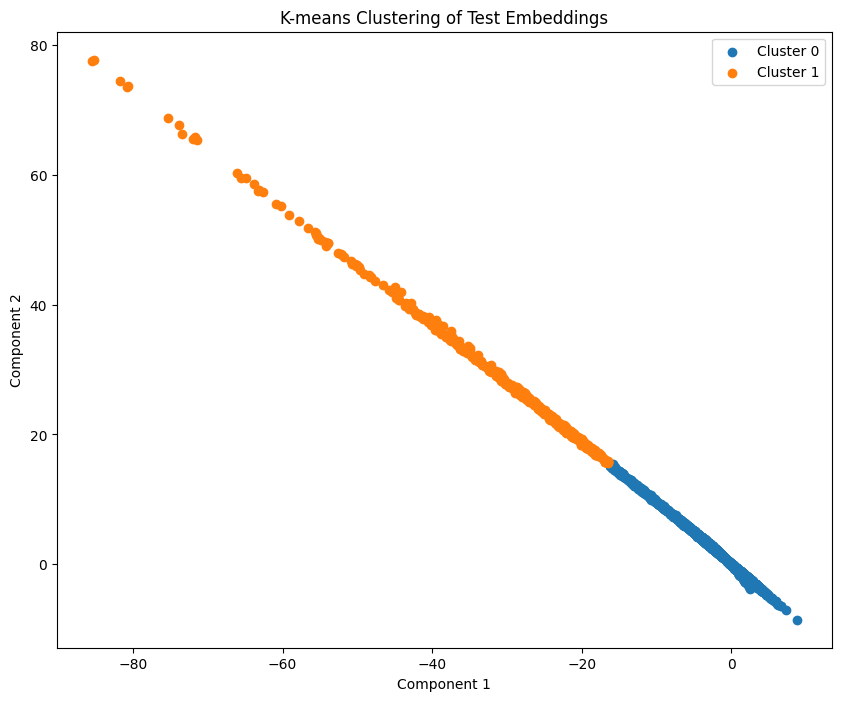

In [65]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
kmeans = KMeans(n_clusters=2, random_state=42)
cluster_labels = kmeans.fit_predict(test_embeddings)
plt.figure(figsize=(10, 8))
for label in np.unique(cluster_labels):
    indices = np.where(cluster_labels == label)
    plt.scatter(test_embeddings[indices, 0], test_embeddings[indices, 1], label=f'Cluster {label}')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('K-means Clustering of Test Embeddings')
plt.legend()
plt.show()


In [69]:
from torch.utils.tensorboard import SummaryWriter
import os
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt


test_embeddings = np.load('test_embeddings.npy')
test_predicted_labels = np.load('test_predicted_labels.npy')


tsne = TSNE(n_components=2, random_state=42)
test_embeddings_2d = tsne.fit_transform(test_embeddings)


log_dir = "logs"
os.makedirs(log_dir, exist_ok=True)
writer = SummaryWriter(log_dir)

writer.add_embedding(test_embeddings_2d,
                     metadata=test_predicted_labels,
                     tag='2D_Embeddings')

writer.close()


In [70]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 100543), started 0:19:39 ago. (Use '!kill 100543' to kill it.)

<IPython.core.display.Javascript object>